# Detection Malicious URL Using ML Models

## Load dataset

In [1]:
import pandas as pd

data = pd.read_csv('malicious_phish.csv')
data.head()

,url,type
0,br-icloud.com.br,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign
3,http://www.garage-pirenne.be/index.php?option=...,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement


## Preprocessing

In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 651191 entries, 0 to 651190
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   url     651191 non-null  object
 1   type    651191 non-null  object
dtypes: object(2)
memory usage: 9.9+ MB


In [3]:
data.isnull().sum()

url     0
type    0
dtype: int64

In [4]:
count = data.type.value_counts()
count

type
benign        428103
defacement     96457
phishing       94111
malware        32520
Name: count, dtype: int64

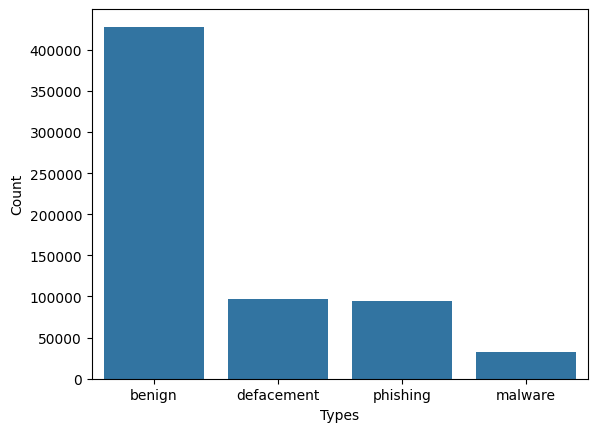

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.barplot(x=count.index, y=count)
plt.xlabel('Types')
plt.ylabel('Count');

In [6]:
data.shape

(651191, 2)

In [7]:
data.duplicated().sum()

10066

In [8]:
data.drop_duplicates(inplace=True)
data.duplicated().sum()

0

## Feature Engineering

### 1. Remove www.
Because it's usually not useful for identifying whether a URL is malicious or not.

In [9]:
data['url'] = data['url'].replace('www.', '', regex=True)
data.head()

,url,type
0,br-icloud.com.br,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign
3,http://garage-pirenne.be/index.php?option=com_...,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement


### 2. Convert url type to numeric

In [10]:
data["url_type"] = data["type"].map({
    'benign':0,
    'defacement':1,
    'phishing':2,
    'malware':3
});
data.head()

,url,type,url_type
0,br-icloud.com.br,phishing,2
1,mp3raid.com/music/krizz_kaliko.html,benign,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1


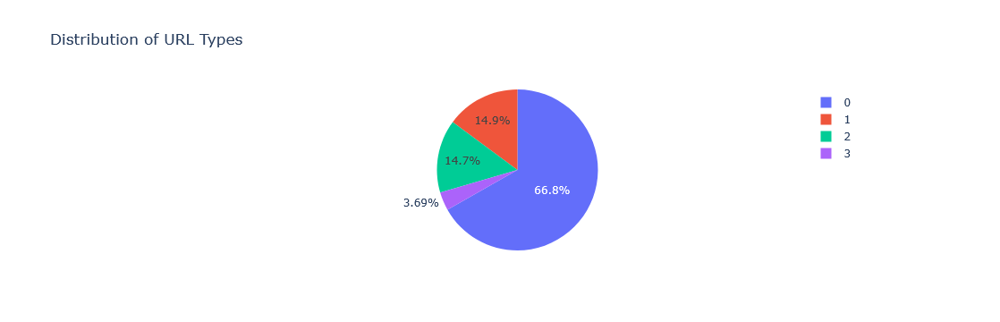

In [11]:
import plotly.express as px

fig = px.pie(data, names='url_type', title='Distribution of URL Types', template='plotly')
fig.show()

### 3. URL length
Because  Malicious URLs are often unusually long or short

In [12]:
def get_url_length(url):
    # Remove common prefixes
    prefixes = ['http://', 'https://']
    for prefix in prefixes:
        if url.startswith(prefix):
            url = url[len(prefix):]

    # Remove 'www.' if present
    url = url.replace('www.', '')

    # Return the length of the remaining URL
    return len(url)

data['url_len'] = data['url'].apply(lambda x: get_url_length(str(x)))
data.head()

,url,type,url_type,url_len
0,br-icloud.com.br,phishing,2,16
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228


### 5. Number of digits & letters & special caracters

In [13]:
import string

def count_letters(url):
    num_letters = sum(char.isalpha() for char in url)
    return num_letters

def count_digits(url):
    num_digits = sum(char.isdigit() for char in url)
    return num_digits

def count_special_chars(url):
    special_chars = set(string.punctuation)
    num_special_chars = sum(char in special_chars for char in url)
    return num_special_chars

In [14]:
data['letters_count']        = data['url'].apply(lambda x: count_letters(x))
data['digits_count']         = data['url'].apply(lambda x: count_digits(x))
data['special_chars_count']  = data['url'].apply(lambda x: count_special_chars(x))

In [15]:
data.head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count
0,br-icloud.com.br,phishing,2,16,13,0,3
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,29,1,5
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,25,1,5
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77,60,7,17
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228,199,22,14


### 6. Has Shortening service
This checks if the URL is from a URL shortener like:

    `bit.ly, tinyurl.com, goo.gl, ow.ly, etc.`

Attackers often hide malicious links behind shorteners.

In [16]:
import re

def has_shortening_service(url):
    pattern = re.compile(r'https?://(?:www\.)?(?:\w+\.)*(\w+)\.\w+')
    match = pattern.search(url)
    
    if match:
        domain = match.group(1)
        common_shortening_services = ['bit', 'goo', 'tinyurl', 'ow', 't', 'is',
                                      'cli', 'yfrog', 'migre', 'ff', 'url4', 'twit',
                                      'su', 'snipurl', 'short', 'BudURL', 'ping', 
                                      'post', 'Just', 'bkite', 'snipr', 'fic', 
                                      'loopt', 'doiop', 'short', 'kl', 'wp', 
                                      'rubyurl', 'om', 'to', 'bit', 't', 'lnkd', 
                                      'db', 'qr', 'adf', 'goo', 'bitly', 'cur', 
                                      'tinyurl', 'ow', 'bit', 'ity', 'q', 'is', 
                                      'po', 'bc', 'twitthis', 'u', 'j', 'buzurl', 
                                      'cutt', 'u', 'yourls', 'x', 'prettylinkpro', 
                                      'scrnch', 'filoops', 'vzturl', 'qr', '1url', 
                                      'tweez', 'v', 'tr', 'link', 'zip']
        
        if domain.lower() in common_shortening_services:
            return 1
    return 0

In [17]:
data['shortened']  = data['url'].apply(lambda x: has_shortening_service(x))
data.head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count,shortened
0,br-icloud.com.br,phishing,2,16,13,0,3,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,29,1,5,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,25,1,5,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77,60,7,17,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228,199,22,14,0


In [18]:
data[data['shortened'] == 1].head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count,shortened
93007,http://bit.ly/R1Y0kU?2000.Ford.F250.Lariat/130...,phishing,2,98,50,36,19,1
128002,http://bit.ly/M77GIA?ferias=93840923804983,phishing,2,35,19,16,7,1
136816,http://q.gs/2537838/paypalcomcgi-binwebscrcmd-...,phishing,2,48,39,7,9,1
448721,http://bit.ly/X0QmNx?2007.Subaru.Impreza.WRX/1...,phishing,2,100,56,32,19,1
520404,https://bit.ly/contentfrb,phishing,2,17,20,0,5,1


### 7. Abnormal URL
Detect if an url is abnormal that's means domain name doesn't align with the full URL structure — possible phishing trick.
For example:
    URL says paypal-login.com but the real PayPal domain is paypal.com.

In [19]:
from urllib.parse import urlparse

def abnormal_url(url):
    parsed_url = urlparse(url)
    netloc = parsed_url.netloc
    if netloc and netloc in url:
        return 0  # NOT abnormal
    return 1      # Abnormal


data['abnormal_url']  = data['url'].apply(lambda x: abnormal_url(x))
data.head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count,shortened,abnormal_url
0,br-icloud.com.br,phishing,2,16,13,0,3,0,1
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,29,1,5,0,1
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,25,1,5,0,1
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77,60,7,17,0,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228,199,22,14,0,0


### 8. Has https
HTTPS is a sign of a more secure and legitimate site.

In [20]:
def secure_http(url):
    return int(urlparse(url).scheme == 'https')

data['secure_http']  = data['url'].apply(lambda x: secure_http(x))
data.head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count,shortened,abnormal_url,secure_http
0,br-icloud.com.br,phishing,2,16,13,0,3,0,1,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,29,1,5,0,1,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,25,1,5,0,1,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77,60,7,17,0,0,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228,199,22,14,0,0,0


### 9. Has ip Address
Instead of using a domain like example.com, malicious links often use raw IPs 

In [21]:
import ipaddress
from urllib.parse import urlparse

def have_ip_address(url):
    try:
        parsed_url = urlparse(url)
        if parsed_url.hostname:
            ipaddress.ip_address(parsed_url.hostname)
            return 1  # Return 1 for valid IP
    except ValueError:
        pass  # Invalid IP or hostname
    return 0  # Return 0 otherwise

data['have_ip'] = data['url'].apply(lambda x: have_ip_address(x))
data.head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count,shortened,abnormal_url,secure_http,have_ip
0,br-icloud.com.br,phishing,2,16,13,0,3,0,1,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,29,1,5,0,1,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,25,1,5,0,1,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77,60,7,17,0,0,0,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228,199,22,14,0,0,0,0


### Caracters frequency

In [22]:
feature = ['@','?','-','=','.','#','%','+','$','!','*',',','//']
for a in feature:
    data[a] = data['url'].apply(lambda i: i.count(a))

In [23]:
data.head()

,url,type,url_type,url_len,letters_count,digits_count,special_chars_count,shortened,abnormal_url,secure_http,...,=,.,#,%,+,$,!,*,",",//
0,br-icloud.com.br,phishing,2,16,13,0,3,0,1,0,...,0,2,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,29,1,5,0,1,0,...,0,2,0,0,0,0,0,0,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,25,1,5,0,1,0,...,0,2,0,0,0,0,0,0,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,77,60,7,17,0,0,0,...,4,2,0,0,0,0,0,0,0,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,228,199,22,14,0,0,0,...,3,2,0,0,0,0,0,0,0,1


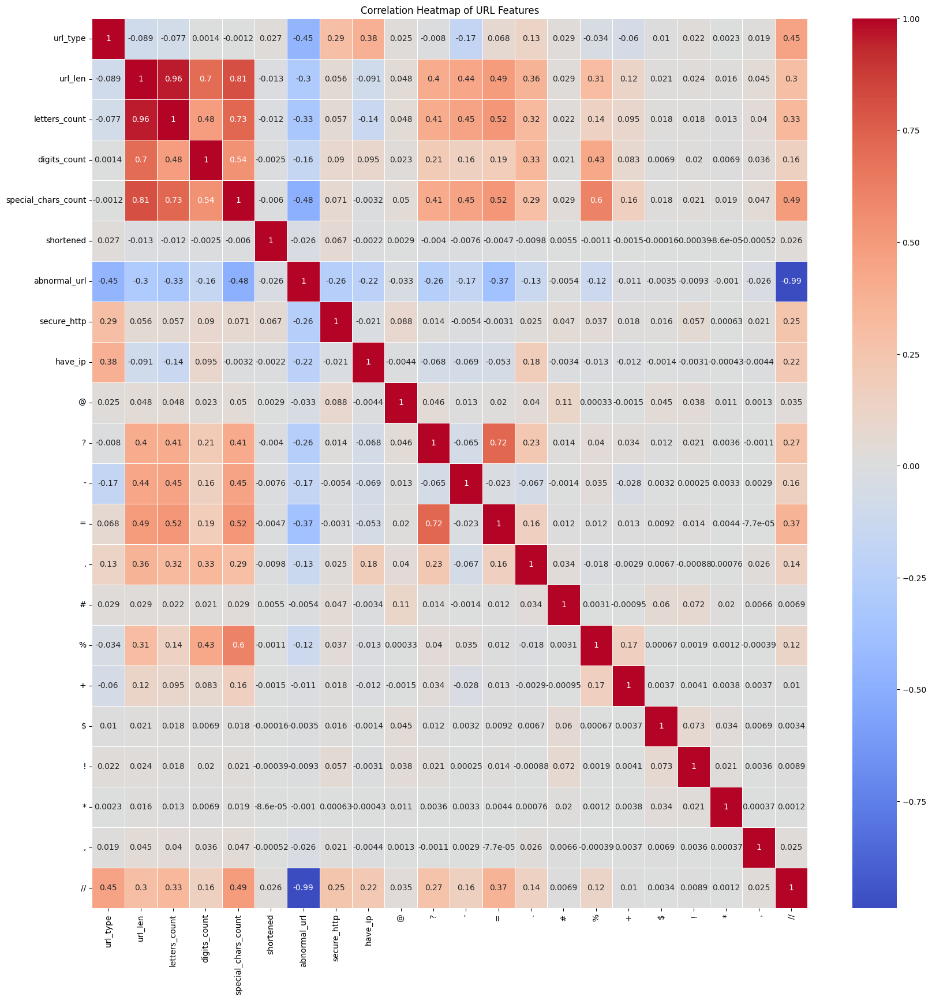

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_data = data.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(20, 20))
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of URL Features')
plt.show()


In [26]:
data.columns

Index(['url', 'type', 'url_type', 'url_len', 'letters_count', 'digits_count',
       'special_chars_count', 'shortened', 'abnormal_url', 'secure_http',
       'have_ip', '@', '?', '-', '=', '.', '#', '%', '+', '$', '!', '*', ',',
       '//'],
      dtype='object')

In [27]:
data.dtypes

url                    object
type                   object
url_type                int64
url_len                 int64
letters_count           int64
digits_count            int64
special_chars_count     int64
shortened               int64
abnormal_url            int64
secure_http             int64
have_ip                 int64
@                       int64
?                       int64
-                       int64
=                       int64
.                       int64
#                       int64
%                       int64
+                       int64
$                       int64
!                       int64
*                       int64
,                       int64
//                      int64
dtype: object

## Data splitting

In [74]:
X = data.drop(['url','url_type','type'], axis=1)
y = data['url_type']

In [75]:
X = X.drop_duplicates()
y = y.loc[X.index]  # align labels

In [76]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.3, random_state=42)

In [77]:
print(f"X_train Shape : {x_train.shape}")
print(f"Y_train Shape : {y_train.shape}")
print(f"X_test  Shape : {x_test.shape}")
print(f"Y_test  Shape : {y_test.shape}")

X_train Shape : (118673, 21)
Y_train Shape : (118673,)
X_test  Shape : (50861, 21)
Y_test  Shape : (50861,)


### Trainig without balancing


--- DecisionTreeClassifier ---
Accuracy: 90.96%
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.95    128371
           1       0.93      0.96      0.95     28591
           2       0.80      0.58      0.67     28326
           3       0.93      0.87      0.90      7050

    accuracy                           0.91    192338
   macro avg       0.90      0.84      0.87    192338
weighted avg       0.90      0.91      0.90    192338



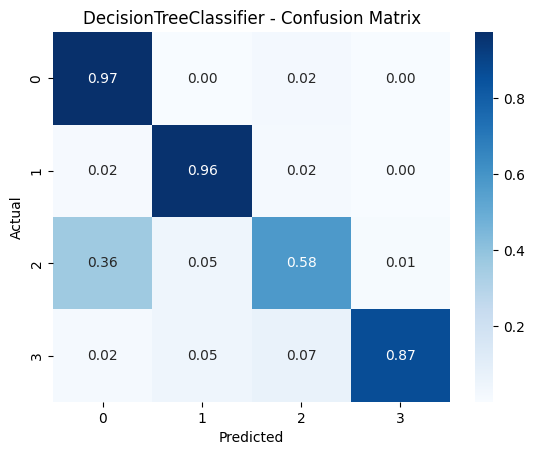


--- RandomForestClassifier ---
Accuracy: 91.52%
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95    128371
           1       0.93      0.97      0.95     28591
           2       0.83      0.58      0.69     28326
           3       0.96      0.87      0.91      7050

    accuracy                           0.92    192338
   macro avg       0.91      0.85      0.87    192338
weighted avg       0.91      0.92      0.91    192338



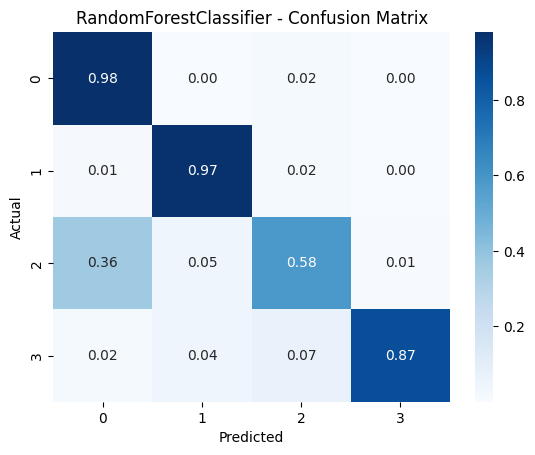


--- KNeighborsClassifier ---
Accuracy: 89.42%
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.94    128371
           1       0.90      0.95      0.92     28591
           2       0.74      0.54      0.63     28326
           3       0.94      0.84      0.89      7050

    accuracy                           0.89    192338
   macro avg       0.87      0.82      0.84    192338
weighted avg       0.89      0.89      0.89    192338



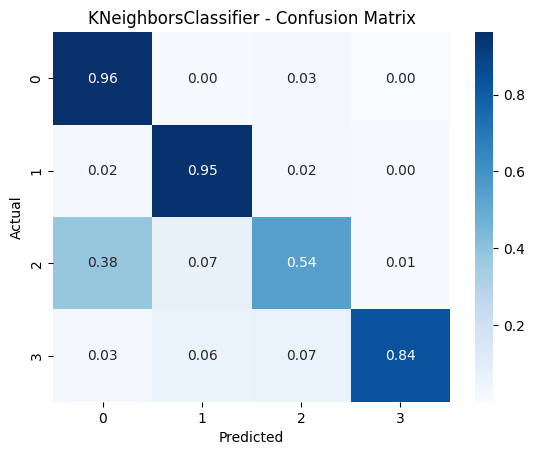


--- SGDClassifier ---
Accuracy: 82.07%
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.96      0.90    128371
           1       0.72      0.98      0.83     28591
           2       0.74      0.02      0.05     28326
           3       0.87      0.75      0.81      7050

    accuracy                           0.82    192338
   macro avg       0.79      0.68      0.65    192338
weighted avg       0.81      0.82      0.76    192338



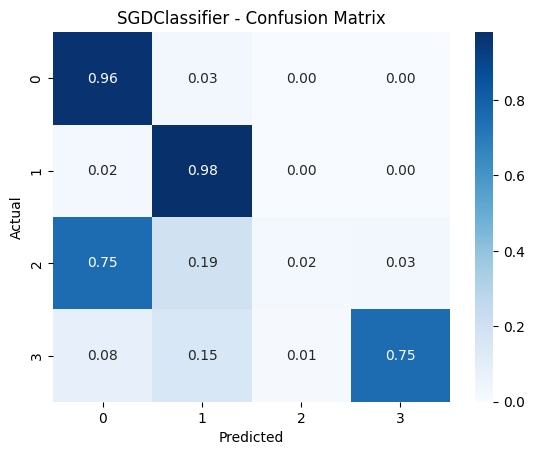


--- GaussianNB ---
Accuracy: 80.18%
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.93      0.89    128371
           1       0.68      1.00      0.81     28591
           2       0.61      0.03      0.05     28326
           3       0.69      0.79      0.74      7050

    accuracy                           0.80    192338
   macro avg       0.71      0.69      0.62    192338
weighted avg       0.78      0.80      0.75    192338



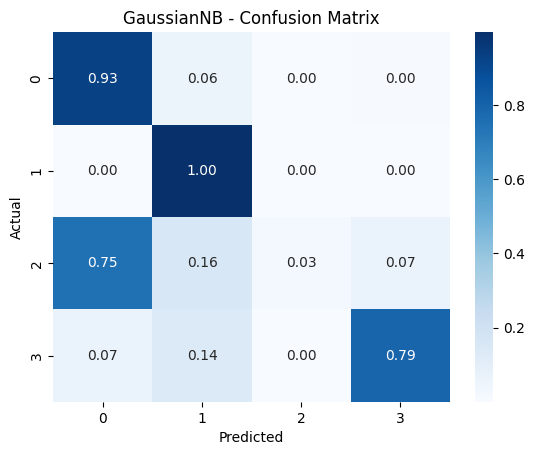

In [60]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier, LogisticRegression, RidgeClassifier, Perceptron
from sklearn.naive_bayes import GaussianNB, MultinomialNB

# List of model classes
models = [
    DecisionTreeClassifier,
    RandomForestClassifier,
    KNeighborsClassifier,
    SGDClassifier,
    GaussianNB
]

accuracy_test = []

for model_cls in models:
    model = model_cls()
    model.fit(x_train, y_train)
    preds = model.predict(x_test)
    
    acc = accuracy_score(y_test, preds)
    accuracy_test.append(acc)
    
    print(f"\n--- {model_cls.__name__} ---")
    print(f"Accuracy: {acc:.2%}")
    print("Classification Report:")
    print(classification_report(y_test, preds))

    # Confusion Matrix Heatmap
    cm = confusion_matrix(y_test, preds, normalize='true')
    sns.heatmap(cm, annot=True, fmt=".2f", cmap="Blues")
    plt.title(f"{model_cls.__name__} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


### Balance data with smote

In [78]:
# Balance data with smote
duplicates_before = pd.DataFrame(x_train).duplicated().sum()
print(f"Duplicates before SMOTE: {duplicates_before}")

# Apply SMOTE
from imblearn.over_sampling import SMOTE
smote = SMOTE()
x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train)

# Check duplicates after SMOTE
duplicates_after = pd.DataFrame(x_train_smote).duplicated().sum()
print(f"Duplicates after SMOTE: {duplicates_after}")

Duplicates before SMOTE: 0
Duplicates after SMOTE: 147825


In [80]:
# After SMOTE
x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train)

# Combine features and labels into a DataFrame to drop duplicates
train_smote = pd.DataFrame(x_train_smote)
train_smote['label'] = y_train_smote

# Drop duplicates
train_smote = train_smote.drop_duplicates()

# Separate again into X and y
x_train_smote_cleaned = train_smote.drop('label', axis=1)
y_train_smote_cleaned = train_smote['label']

print(f"New shape after removing duplicates: {x_train_smote_cleaned.shape}")


New shape after removing duplicates: (186336, 21)


In [81]:
import pandas as pd

print("Class distribution after SMOTE:")
print(pd.Series(y_train_smote_cleaned).value_counts())

Class distribution after SMOTE:
label
0    83135
1    44050
2    42805
3    16346
Name: count, dtype: int64


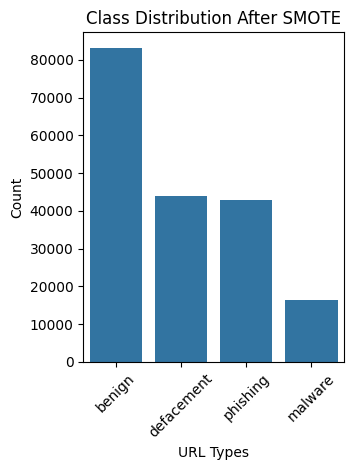

In [82]:
plt.subplot(1, 2, 2)
count_after = pd.Series(y_train_smote_cleaned).value_counts()
# Map numeric labels back to text labels for readability
count_after.index = count_after.index.map({
    0: 'benign',
    1: 'defacement',
    2: 'phishing',
    3: 'malware'
})
sns.barplot(x=count_after.index, y=count_after.values)
plt.title('Class Distribution After SMOTE')
plt.xlabel('URL Types')
plt.ylabel('Count')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## Training with smote

Accuracy: 85.51%
              precision    recall  f1-score   support

      benign       0.95      0.85      0.90    128371
  defacement       0.93      0.96      0.94     28591
    phishing       0.53      0.77      0.63     28326
     malware       0.87      0.88      0.87      7050

    accuracy                           0.86    192338
   macro avg       0.82      0.86      0.83    192338
weighted avg       0.88      0.86      0.86    192338



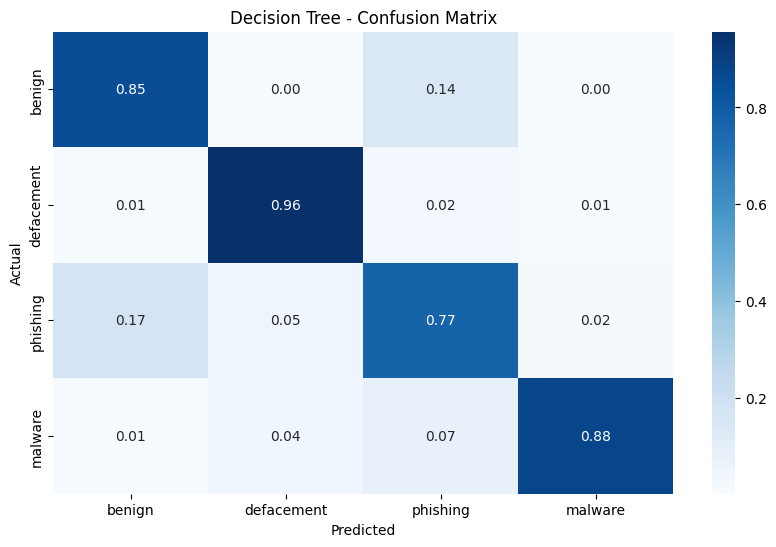

In [83]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Train
model = DecisionTreeClassifier(random_state=42)
model.fit(X_resampled, y_resampled)

# Predict
y_pred = model.predict(x_test)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2%}")
print(classification_report(y_test, y_pred, target_names=['benign', 'defacement', 'phishing', 'malware']))

# Confusion Matrix
plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred, normalize='true'), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=['benign', 'defacement', 'phishing', 'malware'],
            yticklabels=['benign', 'defacement', 'phishing', 'malware'])
plt.title("Decision Tree - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

model_DT = model

Accuracy: 86.10%
              precision    recall  f1-score   support

      benign       0.96      0.86      0.90    128371
  defacement       0.93      0.96      0.95     28591
    phishing       0.54      0.78      0.63     28326
     malware       0.90      0.88      0.89      7050

    accuracy                           0.86    192338
   macro avg       0.83      0.87      0.84    192338
weighted avg       0.89      0.86      0.87    192338



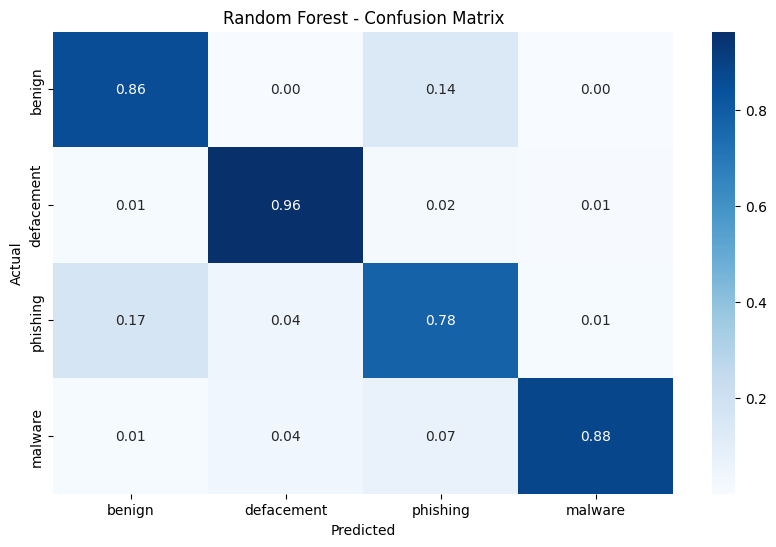

In [85]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

# Train
model = RandomForestClassifier(random_state=42)
model.fit(X_resampled, y_resampled)

# Predict
y_pred = model.predict(x_test)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2%}")
print(classification_report(y_test, y_pred, target_names=['benign', 'defacement', 'phishing', 'malware']))

# Confusion Matrix
plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred, normalize='true'), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=['benign', 'defacement', 'phishing', 'malware'],
            yticklabels=['benign', 'defacement', 'phishing', 'malware'])
plt.title("Random Forest - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [86]:
model_RF = model

Accuracy: 83.73%
              precision    recall  f1-score   support

      benign       0.95      0.84      0.89    128371
  defacement       0.89      0.95      0.92     28591
    phishing       0.50      0.72      0.59     28326
     malware       0.82      0.88      0.85      7050

    accuracy                           0.84    192338
   macro avg       0.79      0.85      0.81    192338
weighted avg       0.87      0.84      0.85    192338



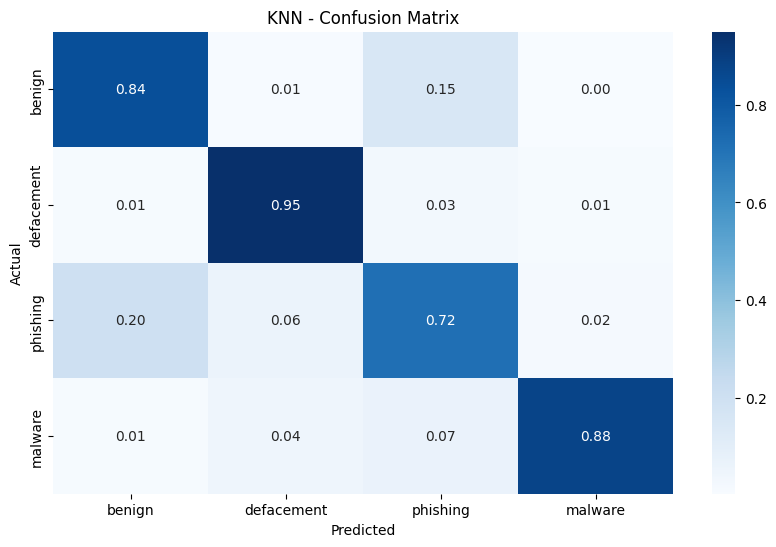

In [87]:
# K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier

# Train
model = KNeighborsClassifier()
model.fit(X_resampled, y_resampled)

# Predict
y_pred = model.predict(x_test)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2%}")
print(classification_report(y_test, y_pred, target_names=['benign', 'defacement', 'phishing', 'malware']))

# Confusion Matrix
plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred, normalize='true'), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=['benign', 'defacement', 'phishing', 'malware'],
            yticklabels=['benign', 'defacement', 'phishing', 'malware'])
plt.title("KNN - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

model_knn = model

Accuracy: 60.87%
              precision    recall  f1-score   support

      benign       0.95      0.51      0.66    128371
  defacement       0.71      0.94      0.81     28591
    phishing       0.25      0.67      0.37     28326
     malware       0.55      0.81      0.65      7050

    accuracy                           0.61    192338
   macro avg       0.62      0.73      0.62    192338
weighted avg       0.80      0.61      0.64    192338



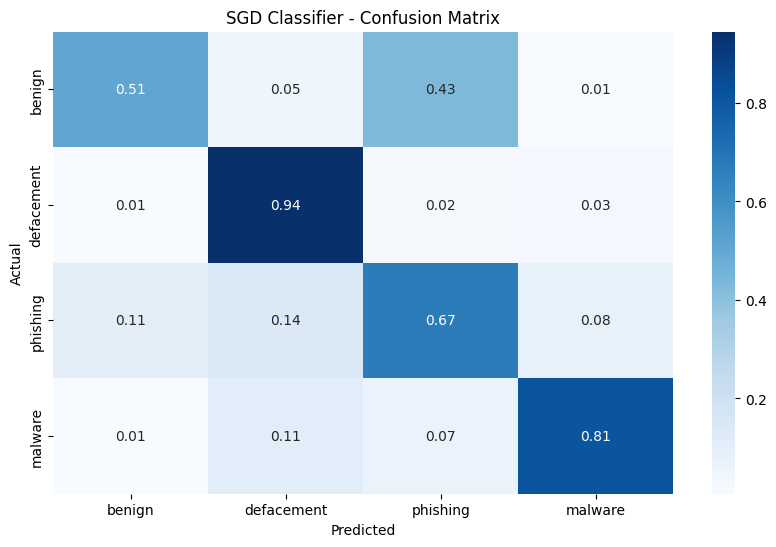

In [91]:
# SGD Classifier
from sklearn.linear_model import SGDClassifier

# Initialize and train model
model = SGDClassifier(random_state=42, max_iter=1000, tol=1e-3)
model.fit(X_resampled, y_resampled)  # Single training step

# Predict
y_pred = model.predict(x_test)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2%}")
print(classification_report(y_test, y_pred, target_names=['benign', 'defacement', 'phishing', 'malware']))

# Confusion Matrix
plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred, normalize='true'), 
            annot=True, fmt=".2f", cmap="Blues",
            xticklabels=['benign', 'defacement', 'phishing', 'malware'],
            yticklabels=['benign', 'defacement', 'phishing', 'malware'])
plt.title("SGD Classifier - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

model_sgd = model

Accuracy: 80.02%
              precision    recall  f1-score   support

      benign       0.85      0.93      0.88    128371
  defacement       0.68      1.00      0.81     28591
    phishing       0.63      0.02      0.05     28326
     malware       0.66      0.80      0.72      7050

    accuracy                           0.80    192338
   macro avg       0.70      0.69      0.62    192338
weighted avg       0.78      0.80      0.74    192338



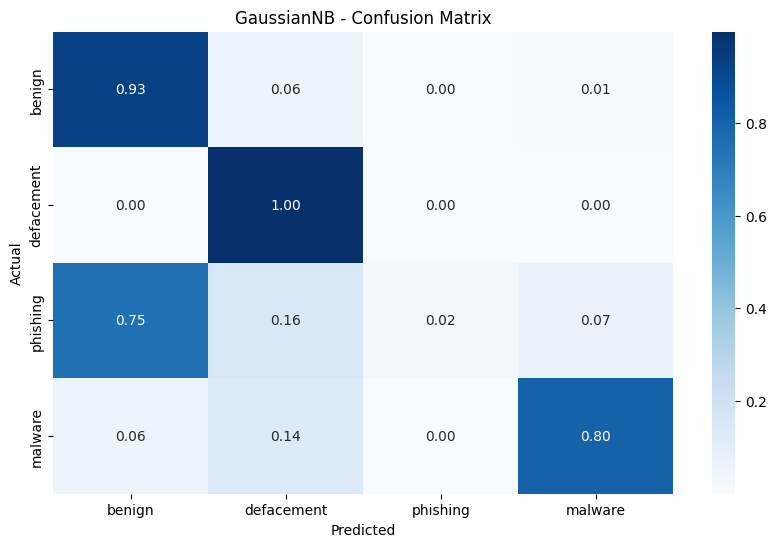

In [92]:
# Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB

# Train
model = GaussianNB()
model.fit(X_resampled, y_resampled)

# Predict
y_pred = model.predict(x_test)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2%}")
print(classification_report(y_test, y_pred, target_names=['benign', 'defacement', 'phishing', 'malware']))

# Confusion Matrix
plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred, normalize='true'), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=['benign', 'defacement', 'phishing', 'malware'],
            yticklabels=['benign', 'defacement', 'phishing', 'malware'])
plt.title("GaussianNB - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

model_nb = model

### Balance data with Undersampling 

In [29]:
from imblearn.under_sampling import RandomUnderSampler

# Initialize undersampler (balances all classes to match the minority class size)
undersampler = RandomUnderSampler(random_state=42)

# Apply undersampling to the training data only (to avoid data leakage)
X_train_under, y_train_under = undersampler.fit_resample(x_train, y_train)

# Check the new class distribution
print("Class distribution after undersampling:")
print(pd.Series(y_train_under).value_counts())

Class distribution after undersampling:
url_type
0    16595
1    16595
2    16595
3    16595
Name: count, dtype: int64



 Decision Tree Results:
Accuracy: 81.89%
Classification Report:
              precision    recall  f1-score   support

      benign       0.95      0.81      0.87    128371
  defacement       0.90      0.94      0.92     28591
    phishing       0.46      0.74      0.57     28326
     malware       0.75      0.89      0.81      7050

    accuracy                           0.82    192338
   macro avg       0.77      0.84      0.79    192338
weighted avg       0.86      0.82      0.83    192338



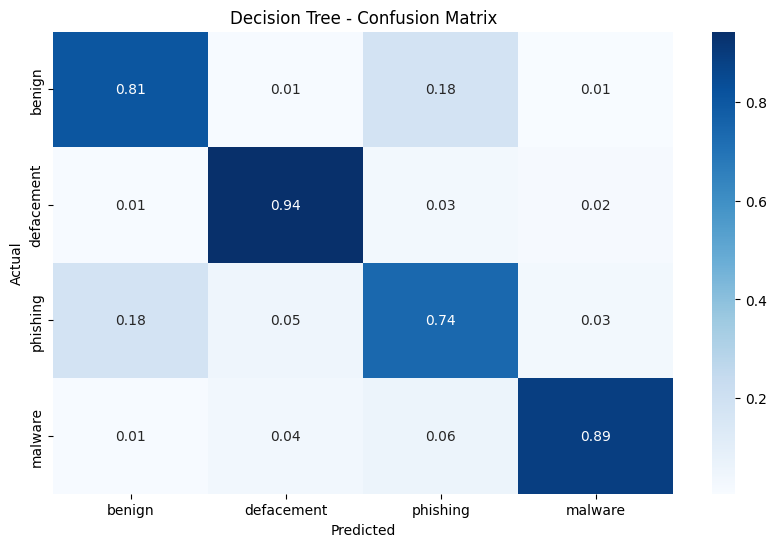


 Random Forest Results:
Accuracy: 84.12%
Classification Report:
              precision    recall  f1-score   support

      benign       0.95      0.83      0.89    128371
  defacement       0.91      0.96      0.93     28591
    phishing       0.50      0.76      0.60     28326
     malware       0.82      0.90      0.86      7050

    accuracy                           0.84    192338
   macro avg       0.80      0.86      0.82    192338
weighted avg       0.88      0.84      0.85    192338



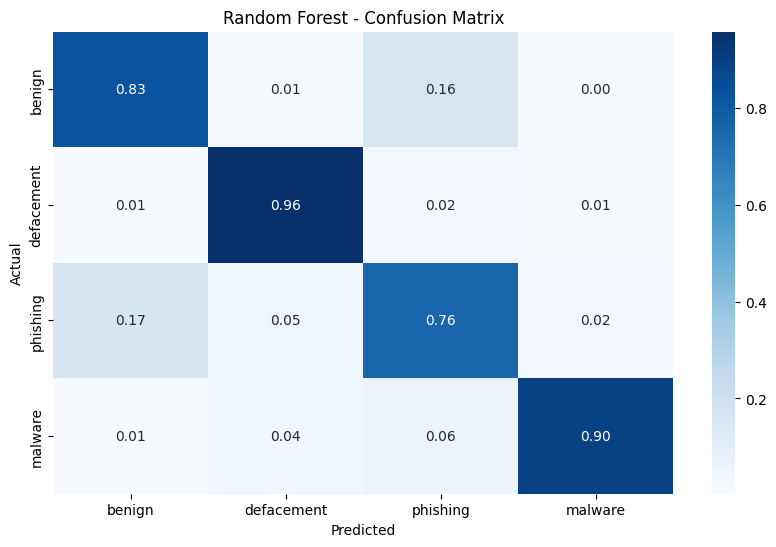


 K-Nearest Neighbors Results:
Accuracy: 79.23%
Classification Report:
              precision    recall  f1-score   support

      benign       0.94      0.78      0.86    128371
  defacement       0.81      0.94      0.87     28591
    phishing       0.43      0.66      0.52     28326
     malware       0.70      0.87      0.78      7050

    accuracy                           0.79    192338
   macro avg       0.72      0.81      0.76    192338
weighted avg       0.84      0.79      0.81    192338



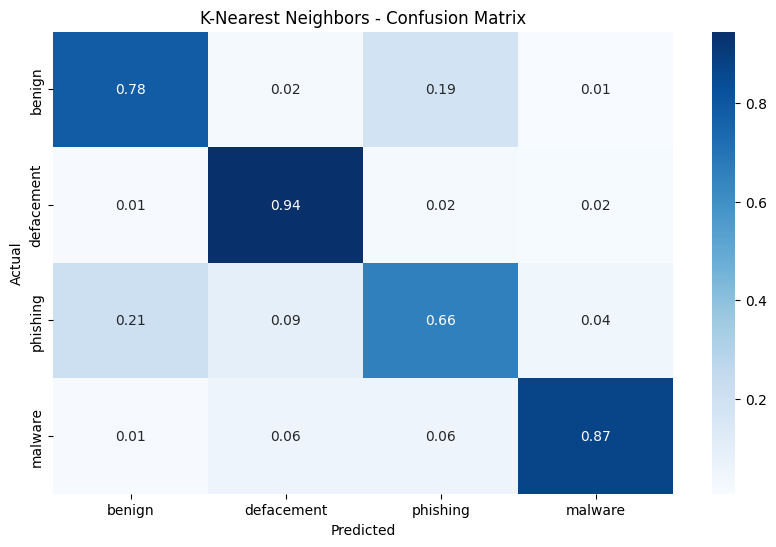


 SGD Classifier Results:
Accuracy: 76.69%
Classification Report:
              precision    recall  f1-score   support

      benign       0.88      0.85      0.86    128371
  defacement       0.61      1.00      0.76     28591
    phishing       0.36      0.21      0.27     28326
     malware       0.86      0.60      0.71      7050

    accuracy                           0.77    192338
   macro avg       0.68      0.66      0.65    192338
weighted avg       0.76      0.77      0.75    192338



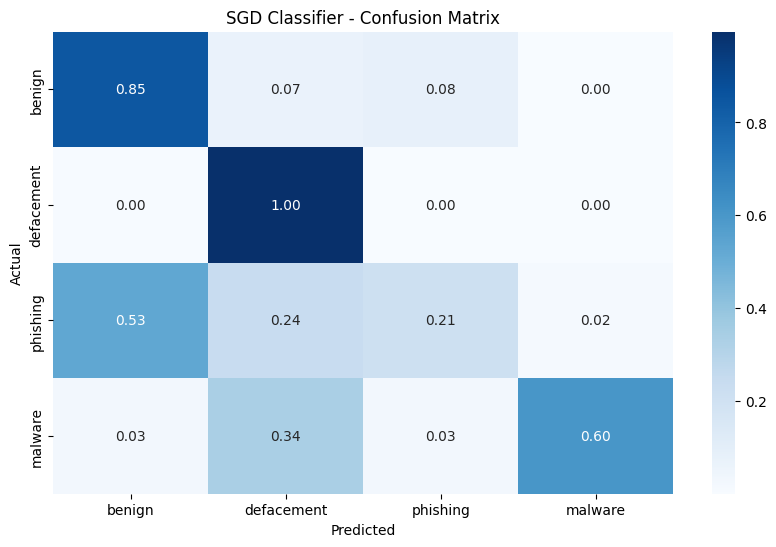


 Gaussian Naive Bayes Results:
Accuracy: 80.23%
Classification Report:
              precision    recall  f1-score   support

      benign       0.85      0.93      0.89    128371
  defacement       0.68      1.00      0.81     28591
    phishing       0.61      0.03      0.05     28326
     malware       0.71      0.79      0.75      7050

    accuracy                           0.80    192338
   macro avg       0.71      0.69      0.62    192338
weighted avg       0.78      0.80      0.75    192338



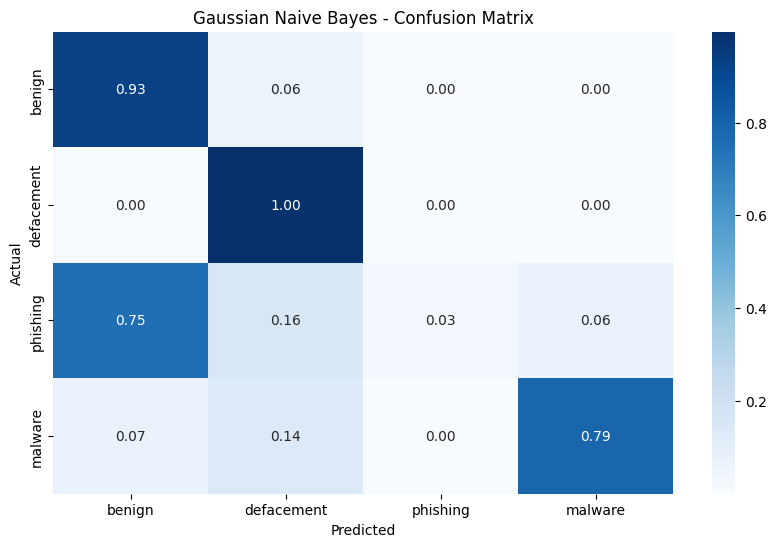

In [99]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# List of models to test
models = [
    ("Decision Tree", DecisionTreeClassifier()),
    ("Random Forest", RandomForestClassifier()),
    ("K-Nearest Neighbors", KNeighborsClassifier()),
    ("SGD Classifier", SGDClassifier()),
    ("Gaussian Naive Bayes", GaussianNB())
]

# Train and evaluate each model
for model_name, model in models:
    # Train on undersampled data
    model.fit(X_train_under, y_train_under)
    
    # Predict on the original test set
    y_pred = model.predict(x_test)
    
    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    print(f"\n {model_name} Results:")
    print(f"Accuracy: {accuracy:.2%}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=['benign', 'defacement', 'phishing', 'malware']))
    
    # Confusion Matrix
    plt.figure(figsize=(10, 6))
    sns.heatmap(confusion_matrix(y_test, y_pred, normalize='true'), 
                annot=True, fmt=".2f", cmap="Blues",
                xticklabels=['benign', 'defacement', 'phishing', 'malware'],
                yticklabels=['benign', 'defacement', 'phishing', 'malware'])
    plt.title(f"{model_name} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

### LSTM

In [158]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout

# Load and prepare data
X = data['url']
y = data['url_type']  # Make sure it's encoded as 0, 1, 2...

# If it's not already numeric, encode labels
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_cat = to_categorical(y_encoded)

# Tokenize URLs
tokenizer = Tokenizer(char_level=True)  # character-level tokenizer works best for URLs
tokenizer.fit_on_texts(X)
X_seq = tokenizer.texts_to_sequences(X)

# Pad sequences to equal length
X_pad = pad_sequences(X_seq, padding='post', maxlen=100)  # 100 chars max per URL

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_pad, y_cat, test_size=0.2, random_state=42)


In [90]:
vocab_size = len(tokenizer.word_index) + 1  # +1 for padding

model_one = Sequential()
model_one.add(Embedding(input_dim=vocab_size, output_dim=32, input_length=100))
model_one.add(LSTM(64, return_sequences=False))
model_one.add(Dropout(0.3))
model_one.add(Dense(32, activation='relu'))
model_one.add(Dense(y_cat.shape[1], activation='softmax'))  # softmax for multi-class

model_one.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_one.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning:

Argument `input_length` is deprecated. Just remove it.



Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)              │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [91]:
model_one.fit(X_train, y_train, epochs=5, batch_size=64, validation_split=0.1)

Epoch 1/5
7326/7326 ━━━━━━━━━━━━━━━━━━━━ 48s 7ms/step - accuracy: 0.9223 - loss: 0.2355 - val_accuracy: 0.9506 - val_loss: 0.1565
Epoch 3/5
7326/7326 ━━━━━━━━━━━━━━━━━━━━ 47s 6ms/step - accuracy: 0.9475 - loss: 0.1652 - val_accuracy: 0.9582 - val_loss: 0.1340
Epoch 4/5
7326/7326 ━━━━━━━━━━━━━━━━━━━━ 48s 6ms/step - accuracy: 0.9568 - loss: 0.1372 - val_accuracy: 0.9606 - val_loss: 0.1221
Epoch 5/5
7326/7326 ━━━━━━━━━━━━━━━━━━━━ 48s 7ms/step - accuracy: 0.9628 - loss: 0.1198 - val_accuracy: 0.9661 - val_loss: 0.1077


In [92]:
loss, acc = model_one.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.2%}")
print(f"Test Loss: {loss:.4f}") 

4070/4070 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - accuracy: 0.9659 - loss: 0.1072
Test Accuracy: 96.56%
Test Loss: 0.1077


In [93]:
from sklearn.metrics import classification_report

y_pred_probs = model_one.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

target_names = ['benign', 'defacement', 'phishing', 'malware']

print(classification_report(y_true, y_pred, target_names=target_names))


4070/4070 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step
              precision    recall  f1-score   support

      benign       0.97      0.99      0.98     85778
  defacement       0.98      0.98      0.98     19104
    phishing       0.93      0.86      0.89     18836
     malware       0.98      0.90      0.94      6521

    accuracy                           0.97    130239
   macro avg       0.96      0.93      0.95    130239
weighted avg       0.97      0.97      0.97    130239



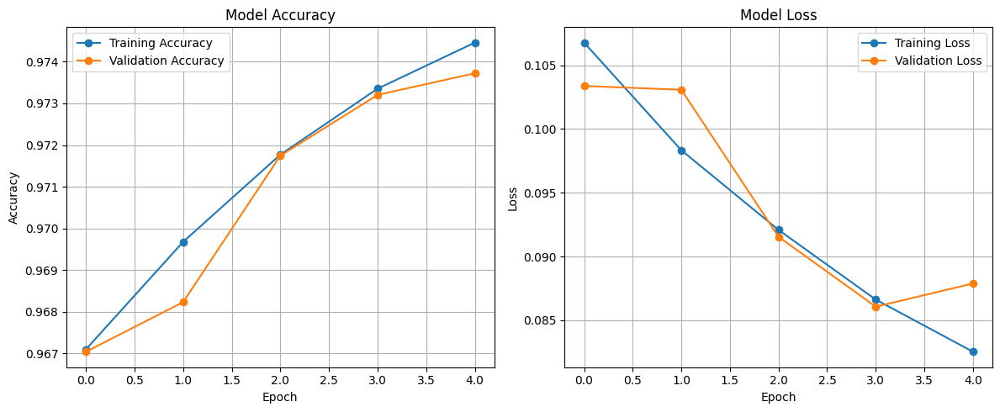

In [174]:
import matplotlib.pyplot as plt

# Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


### Model improvement

In [94]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional

model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=64),
    Bidirectional(LSTM(64, return_sequences=True)),
    Dropout(0.3),
    Bidirectional(LSTM(32)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(4, activation='softmax')  # 4 classes
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [95]:
from tensorflow.keras.callbacks import EarlyStopping

history = model.fit(
    X_train, y_train, 
    validation_split=0.2, 
    epochs=20, 
    batch_size=64
)


Epoch 1/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 126s 18ms/step - accuracy: 0.8829 - loss: 0.3524 - val_accuracy: 0.9431 - val_loss: 0.1690
Epoch 2/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 119s 18ms/step - accuracy: 0.9471 - loss: 0.1670 - val_accuracy: 0.9590 - val_loss: 0.1222
Epoch 3/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 118s 18ms/step - accuracy: 0.9593 - loss: 0.1297 - val_accuracy: 0.9662 - val_loss: 0.1063
Epoch 4/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 118s 18ms/step - accuracy: 0.9663 - loss: 0.1079 - val_accuracy: 0.9692 - val_loss: 0.0973
Epoch 5/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 119s 18ms/step - accuracy: 0.9701 - loss: 0.0963 - val_accuracy: 0.9738 - val_loss: 0.0849
Epoch 6/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 119s 18ms/step - accuracy: 0.9730 - loss: 0.0869 - val_accuracy: 0.9735 - val_loss: 0.0841
Epoch 7/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 119s 18ms/step - accuracy: 0.9753 - loss: 0.0801 - val_accuracy: 0.9750 - val_loss: 0.0817
Epoch 8/20
6512/6512 ━━━━━━━━━━━━━━━━━━━━ 119s 18ms/step - accuracy: 

In [96]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc * 100:.2f}%")
print(f"Test Loss: {loss:.4f}") 

4070/4070 ━━━━━━━━━━━━━━━━━━━━ 29s 7ms/step - accuracy: 0.9790 - loss: 0.0739
Test Accuracy: 97.87%
Test Loss: 0.1077


In [97]:
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)
from sklearn.metrics import classification_report

target_names = ['benign', 'defacement', 'phishing', 'malware']
print(classification_report(y_true, y_pred, target_names=target_names))


4070/4070 ━━━━━━━━━━━━━━━━━━━━ 27s 6ms/step
              precision    recall  f1-score   support

      benign       0.98      0.99      0.99     85778
  defacement       0.99      1.00      0.99     19104
    phishing       0.95      0.91      0.93     18836
     malware       0.99      0.95      0.97      6521

    accuracy                           0.98    130239
   macro avg       0.98      0.96      0.97    130239
weighted avg       0.98      0.98      0.98    130239



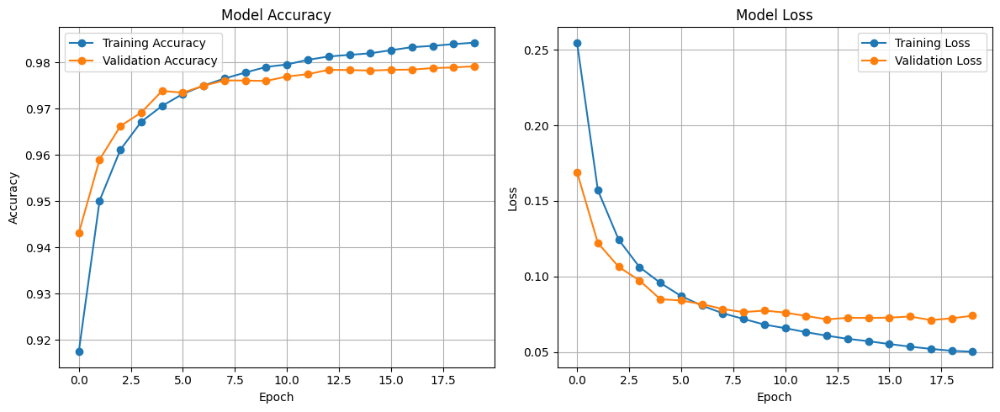

In [98]:
import matplotlib.pyplot as plt

# Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


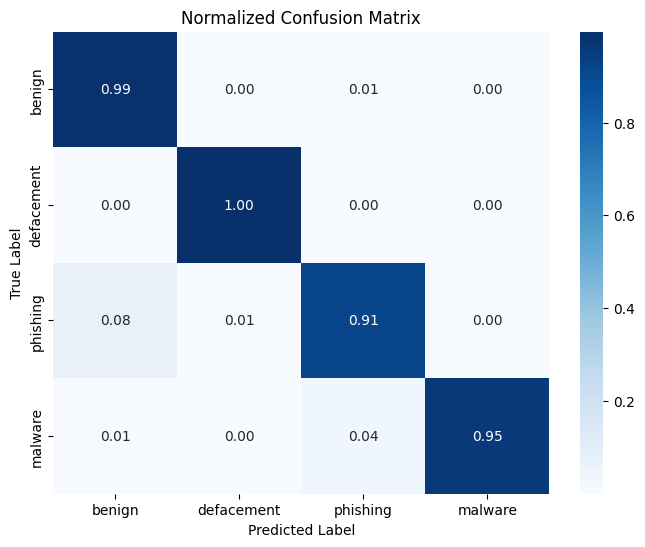

In [172]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(8, 6))
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=target_names, 
            yticklabels=target_names)
plt.title('Normalized Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Test

In [175]:
# Example URL
new_url = ["http://192.168.4.1/files/install.exe"]

# Tokenize with the ORIGINAL tokenizer (do not re-fit!)
X_seq = tokenizer.texts_to_sequences(new_url)  # Use the same tokenizer from training

# Pad sequences (same maxlen=100 and padding='post' as during training)
X_pad = pad_sequences(X_seq, padding='post', maxlen=100)

# Predict
y_pred_probs = model.predict(X_pad)
y_pred_class = np.argmax(y_pred_probs, axis=1)
predicted_label = target_names[y_pred_class[0]]
print(f"The URL is classified as: {predicted_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The URL is classified as: malware


In [176]:
# Example URL
new_url = ["www.google.com"]

# Tokenize with the ORIGINAL tokenizer (do not re-fit!)
X_seq = tokenizer.texts_to_sequences(new_url)  # Use the same tokenizer from training

# Pad sequences (same maxlen=100 and padding='post' as during training)
X_pad = pad_sequences(X_seq, padding='post', maxlen=100)

# Predict
y_pred_probs = model.predict(X_pad)
y_pred_class = np.argmax(y_pred_probs, axis=1)
predicted_label = target_names[y_pred_class[0]]
print(f"The URL is classified as: {predicted_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The URL is classified as: benign
